<a id='1'></a><center> <h1 style="background-color:purple; color:white" ><br>reading and finding more about Data<br></h1>

## importing the libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import datetime as dt
import matplotlib.pyplot as plt
import matplotlib as matplotlib

from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
import plotly.graph_objs as go
import plotly as py
import plotly.offline as pyoff
import warnings
import missingno as msno
import dataframe_image as dfi
import plotly.graph_objs as go 

pd.set_option('display.float_format', lambda x: '%.2f' % x)

## reading the csv file

In [2]:
df = pd.read_csv('test_msa_bb.csv')

C:\Users\imanp\AppData\Local\Programs\Python\Python39\lib\site-packages\IPython\core\interactiveshell.py:3444: DtypeWarning:

Columns (4,18) have mixed types.Specify dtype option on import or set low_memory=False.



## checking the shape and information about Dataset

In [3]:
df.shape

(300000, 19)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300000 entries, 0 to 299999
Data columns (total 19 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   email                    300000 non-null  object 
 1   phone                    300000 non-null  object 
 2   first_name               300000 non-null  object 
 3   last_name                300000 non-null  object 
 4   zip                      300000 non-null  object 
 5   city                     300000 non-null  object 
 6   state                    0 non-null       float64
 7   country                  300000 non-null  object 
 8   birthday_year            0 non-null       float64
 9   gender                   0 non-null       float64
 10  age                      0 non-null       float64
 11  conversion_name          300000 non-null  object 
 12  conversion_date          300000 non-null  object 
 13  conversion_id            300000 non-null  int64  
 14  conv

In [5]:
df.describe()

,state,birthday_year,gender,age,conversion_id,conversion_value,conversion_value_margin,handling_cost
count,0.00,0.00,0.00,0.00,300000.00,300000.00,300000.00,300000.00
mean,NaN,NaN,NaN,NaN,781250.55,939.88,268.35,-61.90
std,NaN,NaN,NaN,NaN,133699.60,1506.03,553.70,38.52
min,NaN,NaN,NaN,NaN,219371.00,-341831.10,-116096.53,-274.10
25%,NaN,NaN,NaN,NaN,661873.75,507.00,39.60,-91.50
50%,NaN,NaN,NaN,NaN,800083.00,897.00,237.82,-76.50
75%,NaN,NaN,NaN,NaN,899629.25,1365.00,478.53,-33.50
max,NaN,NaN,NaN,NaN,982191.00,341831.10,116096.53,803.50


<a id='2'></a><center> <h1 style="background-color:purple; color:white" ><br>Analysing missing values <br></h1>

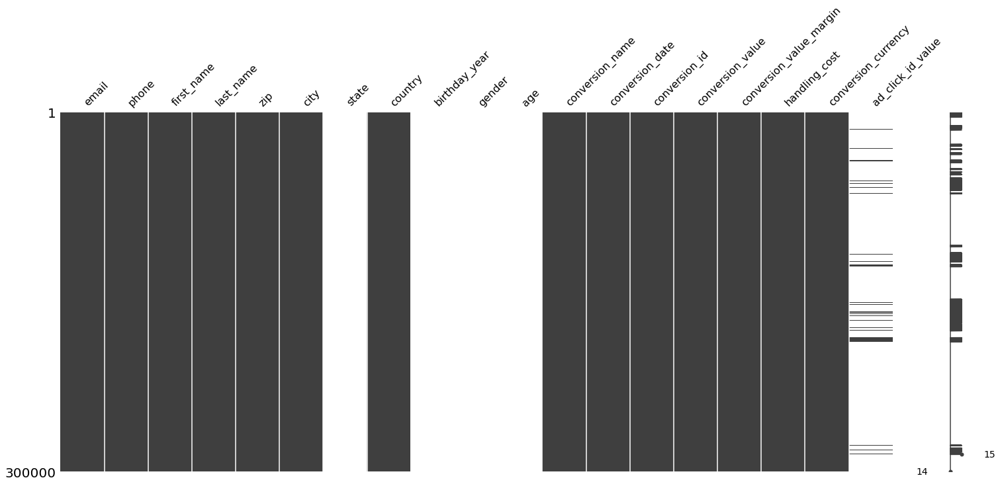

In [6]:
fig = msno.matrix(df)
fig_copy = fig.get_figure()
#fig_copy.set_size_inches(15, 10)

fig_copy.savefig('missing.png',transparent=True) 


## checking how many missing values do we have.
### we can see state, birthday_year, gender, age and ad_click_id_value columns are missing so we do not need them anymore.

In [7]:

df.isnull().sum()

email                           0
phone                           0
first_name                      0
last_name                       0
zip                             0
city                            0
state                      300000
country                         0
birthday_year              300000
gender                     300000
age                        300000
conversion_name                 0
conversion_date                 0
conversion_id                   0
conversion_value                0
conversion_value_margin         0
handling_cost                   0
conversion_currency             0
ad_click_id_value          283989
dtype: int64

## dropping the columns

In [8]:
df = df.drop(columns=['state','birthday_year','gender','gender','age'])


In [9]:
df = df.drop(columns=['ad_click_id_value'])

## Now we do not have any missing value 

In [10]:
df.isnull().sum()

email                      0
phone                      0
first_name                 0
last_name                  0
zip                        0
city                       0
country                    0
conversion_name            0
conversion_date            0
conversion_id              0
conversion_value           0
conversion_value_margin    0
handling_cost              0
conversion_currency        0
dtype: int64

<a id='2'></a><center> <h1 style="background-color:purple; color:white" ><br>Managing columns <br></h1>


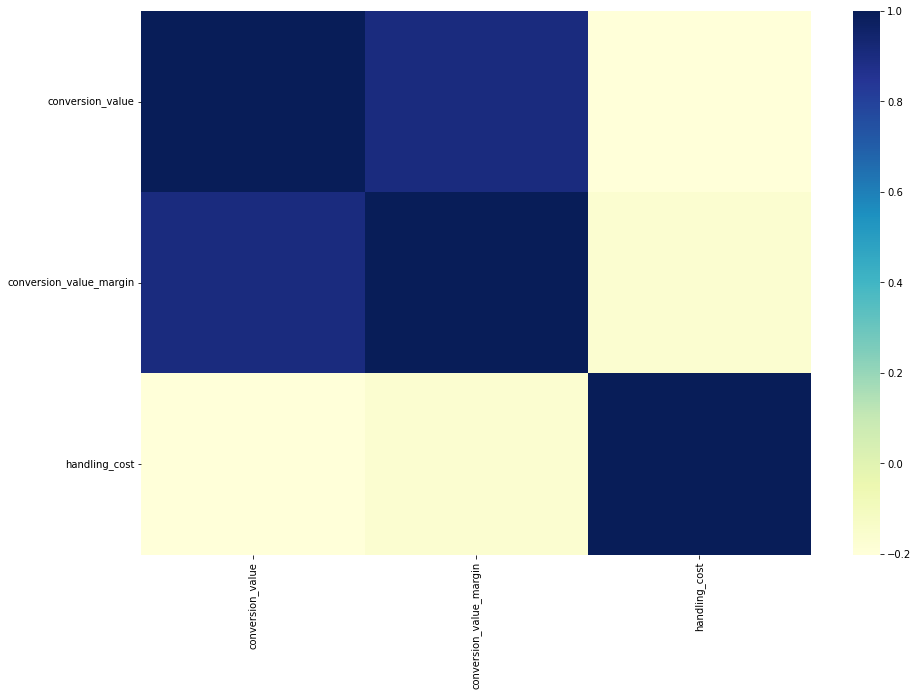

In [11]:
corr = df[['conversion_value','conversion_value_margin','handling_cost']].corr()

# plot the heatmap
heat_plot = sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns,cmap="YlGnBu")




fig = heat_plot.get_figure()
fig.set_size_inches(15, 10)
fig.savefig('heat_plot.png',transparent=True) 

In [12]:
corr

,conversion_value,conversion_value_margin,handling_cost
conversion_value,1.00,0.90,-0.20
conversion_value_margin,0.90,1.00,-0.17
handling_cost,-0.20,-0.17,1.00


## to generate a unique id for each customer I mixed the 4 columns below


In [13]:
df["customer_id"] = df["email"] + df['phone'] + df['first_name'] + df['last_name']


## For total price I summed all values
### Since the handling cost is not included in conversion_value I just added handling cost to conversion_value
### I did not take to account the conversion_value_margin because It's not related to total price

In [14]:
df['total_price'] = df['conversion_value']+df['conversion_value_margin']+df['handling_cost']

## to generate Id for each customer I changed the type of customer_id to category and then encoded it

In [15]:
df['customer_id'] = df.customer_id.astype("category").cat.codes

# conversion_name

## for conversion_name, there are 2 options:
### 1- just encoding the the 3 types we have
### 2- adding the first letter of them to conversion_id so we can remove this column and it would be optimized

### Here we can see there are 4 types which ReturnToSender and Return are same.

In [16]:
df["conversion_name"].unique()

array(['Purchase', 'Cancel', 'ReturnToSender', 'Return'], dtype=object)

### Converting ReturnToSender to Return

In [17]:
df['conversion_name'].loc[(df['conversion_name']=='ReturnToSender')]  = 'Return'

C:\Users\imanp\AppData\Local\Programs\Python\Python39\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## the 1st option which was to encoding the the 3 types we have

In [18]:
#df['conversion_name'] = df['conversion_name'].astype("category").cat.codes

## the 2nd option whcih was adding the first letter of them to conversion_id so we can remove this column and it would be optimized

In [19]:
df['conversion_name'] = df['conversion_name'].str[:1]
df["conversion_id"] = df["conversion_name"] + df["conversion_id"].astype(str) 
df = df.drop(columns=['conversion_name'])

## if we create another table for users then we can access them by their id that we created before, in this case we can delete this info from our dataset but if not we should keep them.

In [20]:
df = df.drop(columns=["email" ,'phone','first_name','last_name'])

In [21]:
dfi.export(df[['customer_id','conversion_id']].head().style, 'dataframe.png')

<a id='2'></a><center> <h1 style="background-color:purple; color:white" ><br>Some Analysis <br></h1>


## How many orders came from which country?


In [22]:
df["country"].value_counts().head().keys()


Index(['IT', 'GB', 'DE', 'FR', 'NL'], dtype='object')

In [23]:
df["country"].value_counts().head().values

array([280766,   4914,   3007,   2867,   2217], dtype=int64)

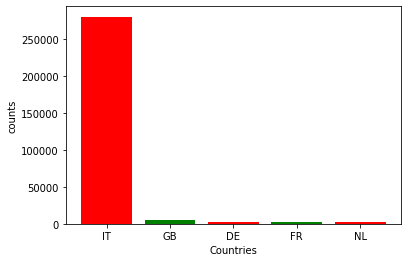

In [24]:

 
# labels for bars
tick_label = df["country"].head()
 
# plotting a bar chart
plt.bar(df["country"].value_counts().head().keys(), df["country"].value_counts().head().values, tick_label = df["country"].value_counts().head().keys(),
        width = 0.8, color = ['red', 'green'])
 
# naming the x-axis
plt.xlabel('Countries')
# naming the y-axis
plt.ylabel('counts')
# plot title

# function to show the plot
plt.savefig('countries.png',transparent=True)

## sorting customers by total price they have bought


In [25]:
df.groupby("customer_id").agg({"total_price":"sum"}).sort_values("total_price", ascending = False).head()

,total_price
customer_id,
7610,313962.28
77369,146342.83
103890,112579.53
107252,89487.04
63464,86692.53


## numbers of total purchased, returned and Canceled

In [26]:
df['conversion_id'].str[:1].value_counts().head()

P    267352
R     23832
C      8816
Name: conversion_id, dtype: int64

array([<AxesSubplot:ylabel='conversion_id'>], dtype=object)

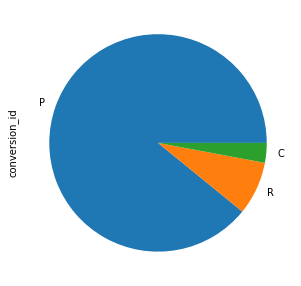

In [27]:
 df['conversion_id'].str[:1].value_counts().head().plot.pie(y='mass',subplots=True, figsize=(5, 5))


In [28]:
df['conversion_id'].str[:1].value_counts().head()

P    267352
R     23832
C      8816
Name: conversion_id, dtype: int64

In [29]:
df = df.sort_values(by='total_price',ascending=False)


<a id='3'></a><center> <h1 style="background-color:purple; color:white" ><br>Outlier Value Analysis<br></h1>

## The interquartile range (IQR), also called the midspread or middle 50%, or technically H-spread, is a measure of statistical dispersion, being equal to the difference between 75th and 25th percentiles, or between upper and lower quartiles, IQR = Q3 − Q1.
### It is a measure of the dispersion similar to standard deviation or variance, but is much more robust against outliers.

In [30]:
for feature in ["conversion_value","conversion_value_margin","handling_cost","total_price"]:

    Q1 = df[feature].quantile(0.01)
    Q3 = df[feature].quantile(0.99)
    IQR = Q3-Q1
    upper = Q3 + 1.5*IQR
    lower = Q1 - 1.5*IQR

    if df[(df[feature] > upper) | (df[feature] < lower)].any(axis=None):
        print(feature, ' : ' , df[(df[feature] > upper) | (df[feature] < lower)].shape[0])

conversion_value  :  98
conversion_value_margin  :  107
handling_cost  :  8
total_price  :  104


## Below plot shows points which are so far, these are outliers as there are not included in the box of other observation i.e no where near the quartiles.

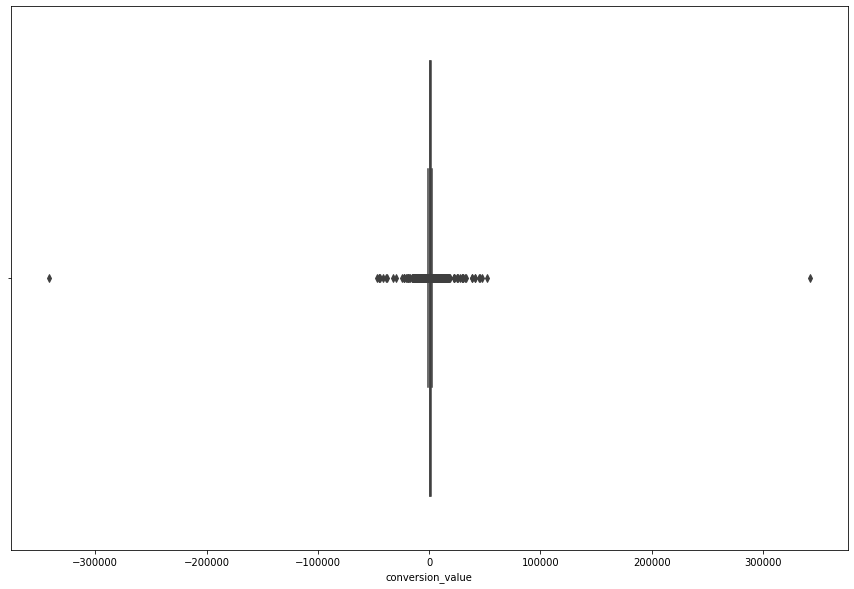

In [31]:
conversion_value = sns.boxplot(x=df['conversion_value'])
fig = conversion_value.get_figure()
fig.set_size_inches(15, 10)
fig.savefig('conversion_value_outlier.png',transparent=True) 

## Looking at the plot below, we can see most of data points are lying center side but there are points which are far from the population .

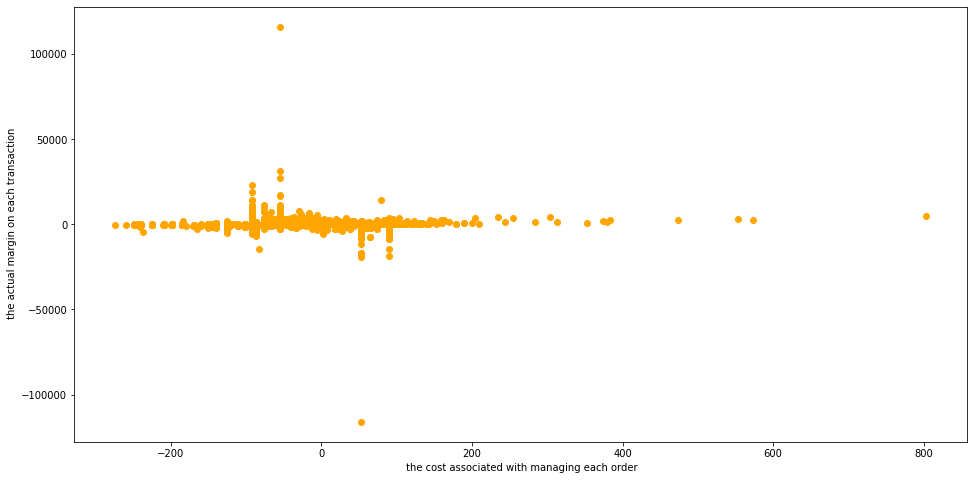

In [32]:
fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(df['handling_cost'], df['conversion_value_margin'],color=['orange'])
ax.set_xlabel(' the cost associated with managing each order')
ax.set_ylabel(' the actual margin on each transaction')
plt.savefig('Outlier2.png',transparent=True)
plt.show()

## Removing outliers
### we can use previously calculated IQR score to filter out the outliers by keeping only valid values.

In [33]:
df_out = df
for feature in ["conversion_value","conversion_value_margin","handling_cost","total_price"]:

    Q1 = df_out[feature].quantile(0.01)
    Q3 = df_out[feature].quantile(0.99)
    IQR = Q3-Q1
    upper = Q3 + 1.5*IQR
    lower = Q1 - 1.5*IQR

    if df_out[(df_out[feature] > upper) | (df_out[feature] < lower)].any(axis=None):
        print(feature)
        outliers_removed = [x for x in df_out[feature] if x >= lower and x <= upper]
        print('Non-outlier observations: %d' % len(outliers_removed))


conversion_value
Non-outlier observations: 299902
conversion_value_margin
Non-outlier observations: 299893
handling_cost
Non-outlier observations: 299992
total_price
Non-outlier observations: 299896


<a id='4'></a><center> <h1 style="background-color:orange; color:white" ><br>Recency - R<br></h1>

##  find out most recent purchase date of each customer and see how many days they are inactive for

In [34]:
df = df[~df["conversion_id"].str.contains("C", na = False)]
df["customer_id"] = df["customer_id"].astype(int)

C:\Users\imanp\AppData\Local\Temp/ipykernel_3260/3763845659.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [35]:
print("Min Date", df["conversion_date"].min(), "Max Date", df["conversion_date"].max())

Min Date 2019-01-01 Max Date 2020-12-01


In [36]:
df["conversion_date"] = pd.to_datetime(df["conversion_date"])
recency = (dt.datetime(2021, 12, 19) - df.groupby("customer_id").agg({"conversion_date":"max"})).rename(columns = {"conversion_date":"Recency"})
recency["Recency"] = recency["Recency"].apply(lambda x: x.days)
recency.head()

C:\Users\imanp\AppData\Local\Temp/ipykernel_3260/2078684932.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Recency
customer_id,
0,1039
1,562
2,913
3,562
4,385


In [37]:
plot_data = [
    go.Histogram(
        x=recency['Recency']
    )
]

plot_layout = go.Layout(
        title='Recency'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
#fig.write_image("image.png")
#pyo.iplot(fig, filename = 'basic-line.jpg')
#pyoff.iplot(fig)


<a id='5'></a><center> <h1 style="background-color:orange; color:white" ><br>Frequency - F<br></h1>

##  find total number orders for each customer. First calculate this and see how frequency look like

In [38]:
freq = df.groupby("customer_id").agg({"conversion_date":"nunique"}).rename(columns={"conversion_date": "Frequency"})
freq.head()

,Frequency
customer_id,
0,1
1,1
2,1
3,1
4,11


In [39]:
plot_data = [
    go.Histogram(
        x=freq.query('Frequency < 1000')['Frequency']
    )
]

plot_layout = go.Layout(
        title='Frequency'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

<a id='6'></a><center> <h1 style="background-color:orange; color:white" ><br>Monetary - M<br></h1>

## how our customer database looks like when we cluster them based on Monetary

In [40]:
monetary = df.groupby("customer_id").agg({"total_price":"sum"}).rename(columns={"total_price":"Monetary"})
monetary.head()

,Monetary
customer_id,
0,439.18
1,256.09
2,370.29
3,876.84
4,13840.74


In [41]:

plot_data = [
    go.Histogram(
        x=monetary.query('Monetary < 10000')['Monetary']
    )
]

plot_layout = go.Layout(
        title='Monetary Value'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

<a id='7'></a><center> <h1 style="background-color:orange; color:white" ><br>Create RFM Score<br></h1>

## We have scores (cluster numbers) for recency, frequency & Monetary.

In [42]:
rfm = pd.concat([recency, freq, monetary],  axis=1)
rfm.head()

,Recency,Frequency,Monetary
customer_id,,,
0,1039,1,439.18
1,562,1,256.09
2,913,1,370.29
3,562,1,876.84
4,385,11,13840.74


## Discretizing variables into equal-sized buckets based on rank or based on sample quantiles. 

In [43]:
rfm["RecencyScore"]  = pd.qcut(rfm["Recency"], 5, labels = [5, 4 , 3, 2, 1])
rfm["FrequencyScore"]= pd.qcut(rfm["Frequency"].rank(method="first"),5, labels=[1,2,3,4,5])
rfm["MonetaryScore"] = pd.qcut(rfm['Monetary'], 5, labels = [1, 2, 3, 4, 5])
rfm.head()

,Recency,Frequency,Monetary,RecencyScore,FrequencyScore,MonetaryScore
customer_id,,,,,,
0,1039,1,439.18,1,1,1
1,562,1,256.09,4,1,1
2,913,1,370.29,1,1,1
3,562,1,876.84,4,1,2
4,385,11,13840.74,5,5,5


##  RFM Scores: Category

In [44]:

rfm["RFM_SCORE"] = (rfm['RecencyScore'].astype(str) + 
                    rfm['FrequencyScore'].astype(str) + 
                    rfm['MonetaryScore'].astype(str))
rfm.head()

,Recency,Frequency,Monetary,RecencyScore,FrequencyScore,MonetaryScore,RFM_SCORE
customer_id,,,,,,,
0,1039,1,439.18,1,1,1,111
1,562,1,256.09,4,1,1,411
2,913,1,370.29,1,1,1,111
3,562,1,876.84,4,1,2,412
4,385,11,13840.74,5,5,5,555


In [45]:
dfi.export(rfm.head().style, 'dataframe4.png')

## To keep things simple, better we name these scores

In [46]:
rfm['Segment'] = 'Low-Value'
rfm.loc[rfm['RFM_SCORE'].astype(int)>2,'Segment'] = 'Mid-Value' 
rfm.loc[rfm['RFM_SCORE'].astype(int)>4,'Segment'] = 'High-Value'



rfm.head()

,Recency,Frequency,Monetary,RecencyScore,FrequencyScore,MonetaryScore,RFM_SCORE,Segment
customer_id,,,,,,,,
0,1039,1,439.18,1,1,1,111,High-Value
1,562,1,256.09,4,1,1,411,High-Value
2,913,1,370.29,1,1,1,111,High-Value
3,562,1,876.84,4,1,2,412,High-Value
4,385,11,13840.74,5,5,5,555,High-Value


## Sorting based on RFM_SCORE group

In [47]:
rfm = rfm.sort_values(by='RFM_SCORE',ascending=False)
rfm


,Recency,Frequency,Monetary,RecencyScore,FrequencyScore,MonetaryScore,RFM_SCORE,Segment
customer_id,,,,,,,,
53700,393,4,8907.55,5,5,5,555,High-Value
110042,384,3,5652.20,5,5,5,555,High-Value
5239,404,4,9041.44,5,5,5,555,High-Value
83775,417,4,4364.33,5,5,5,555,High-Value
16701,389,3,6788.83,5,5,5,555,High-Value
...,...,...,...,...,...,...,...,...
14032,950,1,-1437.73,1,1,1,111,High-Value
14021,1062,1,-5756.02,1,1,1,111,High-Value
14010,1077,1,-7780.68,1,1,1,111,High-Value


<a id='8'></a><center> <h1 style="background-color:orange; color:white" ><br>Summary Statistics<br></h1>

In [48]:
rfmStats = rfm[["Segment","Recency","Frequency", "Monetary"]].groupby("Segment").agg(["mean","median","count", "std"])
rfmStats.columns = rfmStats.columns.map('_'.join).str.strip('|')
rfmStats

,Recency_mean,Recency_median,Recency_count,Recency_std,Frequency_mean,Frequency_median,Frequency_count,Frequency_std,Monetary_mean,Monetary_median,Monetary_count,Monetary_std
Segment,,,,,,,,,,,,
High-Value,674.79,628.00,175550,207.80,1.58,1.00,175550,1.37,2058.84,1361.83,175550,3271.56


<a id='9'></a><center> <h1 style="background-color:orange; color:white" ><br>K-Means<br></h1>

##     CLUSTRING WITH THE K-MEANS

In [49]:
rfm_kmeans = rfm.loc[:,"Recency":"Monetary"]
rfm_kmeans.head()

,Recency,Frequency,Monetary
customer_id,,,
53700,393,4,8907.55
110042,384,3,5652.20
5239,404,4,9041.44
83775,417,4,4364.33
16701,389,3,6788.83


In [50]:

from sklearn.preprocessing import MinMaxScaler
sc = MinMaxScaler((0,1))
dataframe = sc.fit_transform(rfm_kmeans)
kmeans = KMeans(n_clusters = 10)
k_fit = kmeans.fit(dataframe)
k_fit.labels_

array([3, 3, 3, ..., 5, 5, 5])

## we should tell how many clusters we need to K-means algorithm. To find it out, we will apply Elbow Method. Elbow Method simply tells the optimal cluster number for optimal inertia.
### A good model is one with low inertia AND a low number of clusters ( K ).

Text(0.5, 1.0, 'Elbow method for Optimum number of clusters')

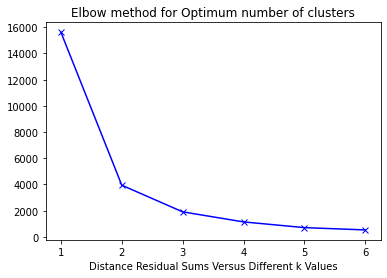

In [51]:
kmeans = KMeans(n_clusters = 3)
k_fit = kmeans.fit(dataframe)
ssd = []

K = range(1,7)

for k in K:
    kmeans = KMeans(n_clusters = k).fit(dataframe)
    ssd.append(kmeans.inertia_)

plt.plot(K,ssd, "bx-")
plt.xlabel("Distance Residual Sums Versus Different k Values")
plt.title("Elbow method for Optimum number of clusters")

In [52]:
plt.savefig('Outlier2.png',transparent=True)


<Figure size 432x288 with 0 Axes>

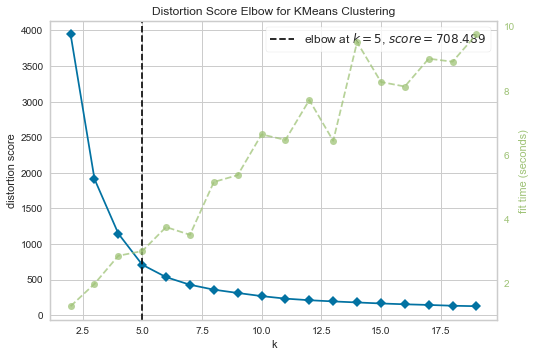

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [53]:
from yellowbrick.cluster import KElbowVisualizer
kmeans = KMeans()
visu = KElbowVisualizer(kmeans, k = (2,20))
visu.fit(dataframe)
visu.poof()

In [59]:
kmeans = KMeans(n_clusters = 5).fit(dataframe)
cluster = kmeans.labels_
pd.DataFrame({"customer_id": rfm.index, "Cluster": cluster})
rfm_kmeans["cluster_no"] = cluster
rfm_kmeans["cluster_no"] = rfm_kmeans["cluster_no"] + 1
rfm_kmeans.head()

,Recency,Frequency,Monetary,cluster_no
customer_id,,,,
53700,393,4,8907.55,3
110042,384,3,5652.20,3
5239,404,4,9041.44,3
83775,417,4,4364.33,3
16701,389,3,6788.83,3


In [60]:
import plotly.express as px
fig = px.scatter_3d(rfm_kmeans, x=rfm_kmeans["Recency"], y=rfm_kmeans["Frequency"], z=rfm_kmeans["Monetary"], color=rfm_kmeans["cluster_no"])
fig.show()